<a href="https://colab.research.google.com/github/Jathurshan0330/Cross-Modal-Transformer/blob/master/Interpret_script_Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Clone Github

In [ ]:
!git clone https://github.com/Jathurshan0330/Cross-Modal-Transformer.git


Cloning into 'Cross-Modal-Transformer'...
remote: Enumerating objects: 416, done.
remote: Counting objects: 100% (124/124), done.
remote: Compressing objects: 100% (118/118), done.
remote: Total 416 (delta 74), reused 12 (delta 6), pack-reused 292
Receiving objects: 100% (416/416), 100.59 MiB | 13.29 MiB/s, done.
Resolving deltas: 100% (167/167), done.


In [ ]:
cd  /content/Cross-Modal-Transformer

/content/Cross-Modal-Transformer


## Install Requirements 

In [ ]:
!pip install numpy
!pip install matplotlib
!pip install h5py 
!pip install einops
!pip install mne

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 49.7 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import random
import mne
from mne.datasets.sleep_physionet.age import fetch_data
from data_preparations.epoch_func import signal_extract

import torch
from torchvision import transforms, datasets
from torch.utils import data
from torch.utils.data import Dataset, DataLoader



#Select Data using mne

In [ ]:
# ignore_data = [[13,2],[36,1],[39,1],[39,2],[52,1],[68,1],[68,2], [69,1],[69,2],[78,1],[78,2],[79,1],[79,2]]
subject_no = [38]   ### Include the No of subject of interest in Sleepedf Dataset.   Use [38] - SC4381 to reproduce Fig 6 in the revised paper
days        = [1]   ### Include the day of the recording. Use [1] to reproduce Fig 6 in the revised paper

In [ ]:
# Extract dataset and convert it to the suitable format to feed to the model
eeg1_1, labels_1, len_1, eeg1_m1, eeg1_std1 = signal_extract(subject_no, days, channel = 'eeg1', filter = True, freq = [0.2,40])
eog_1, _, len_1, eog_m1, eog_std1 = signal_extract(subject_no, days, channel = 'eog', filter = True, freq = [0.2,40])


print(eeg1_1.shape, labels_1.shape, len_1.shape, eeg1_m1.shape, eeg1_std1.shape)
print(eog_1.shape, len_1.shape, eog_m1.shape, eog_std1.shape)


Using default location ~/mne_data for PHYSIONET_SLEEP...
Creating ~/mne_data


Extracting EDF parameters from /root/mne_data/physionet-sleep-data/SC4381F0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8249999  =      0.000 ... 82499.990 secs...
Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage R', 'Sleep stage W']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (16.510 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
1776 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1776 events and 3000 original time points ...


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
/content/Cross-Modal-Transformer/data_preparations/epoch_func.py:184: RuntimeWarning: No matching events found for Sleep stage 4 (event id 4)
  epochs_data = mne.Epochs(raw = sleep_signals, events = events,


0 bad epochs dropped
Using default location ~/mne_data for PHYSIONET_SLEEP...
Extracting EDF parameters from /root/mne_data/physionet-sleep-data/SC4381F0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 8249999  =      0.000 ... 82499.990 secs...
Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage R', 'Sleep stage W']
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.2 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.20
- Lower transition bandwidth: 0.20 Hz (-6 dB cutoff frequency: 0.10 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (16.510 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Not setting metadata
1776 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 1776 events and 3000 original time points ...


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s finished
/content/Cross-Modal-Transformer/data_preparations/epoch_func.py:184: RuntimeWarning: No matching events found for Sleep stage 4 (event id 4)
  epochs_data = mne.Epochs(raw = sleep_signals, events = events,


0 bad epochs dropped
(1776, 1, 3000) (1776,) (1,) (1776,) (1776,)
(1776, 1, 3000) (1,) (1776,) (1776,)


In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

class SleepEDF_Seq_MultiChan_Dataset_Inference(Dataset):
    def __init__(self, eeg_file, eog_file, label_file, device, mean_eeg_l = None, sd_eeg_l = None, 
                 mean_eog_l = None, sd_eog_l = None, mean_eeg2_l = None, sd_eeg2_l = None,transform=None, 
                 target_transform=None, sub_wise_norm = False, num_seq = 5):
        """
      
        """
        # Get the data
       
        self.eeg = eeg_file
        self.eog = eog_file
        self.labels = label_file

        self.labels = torch.from_numpy(self.labels)
        

        bin_labels = np.bincount(self.labels)
        print(f"Labels count: {bin_labels}")
        print(f"Shape of EEG : {self.eeg.shape} , EOG : {self.eog.shape}")#, EMG: {self.eeg2.shape}")
        print(f"Shape of Labels : {self.labels.shape}")

        if sub_wise_norm == True:
          print(f"Reading Subject wise mean and sd")
          
          self.mean_eeg  = mean_eeg_l
          self.sd_eeg = sd_eeg_l
          self.mean_eog  = mean_eog_l
          self.sd_eog = sd_eog_l
            

        self.sub_wise_norm = sub_wise_norm
        self.device = device
        self.transform = transform
        self.target_transform = target_transform
        self.num_seq = num_seq

    def __len__(self):
        return len(self.labels) - self.num_seq

    def __getitem__(self, idx):
        eeg_data = self.eeg[idx:idx+self.num_seq].squeeze()   
        eog_data = self.eog[idx:idx+self.num_seq].squeeze() 
        label = self.labels[idx:idx+self.num_seq,]   


        if self.sub_wise_norm ==True:
          eeg_data = (eeg_data - self.mean_eeg[idx]) / self.sd_eeg[idx]
          eog_data = (eog_data - self.mean_eog[idx]) / self.sd_eog[idx]
        elif self.mean and self.sd:
          eeg_data = (eeg_data-self.mean[0])/self.sd[0]
          eog_data = (eog_data-self.mean[1])/self.sd[1]
        if self.transform:
            eeg_data = self.transform(eeg_data)
            eog_data = self.transform(eog_data)
        if self.target_transform:
            label = self.target_transform(label)
        return eeg_data, eog_data, label



cuda


In [ ]:
num_seq = 15
print(eeg1_1.shape, labels_1.shape, len_1.shape, eeg1_m1.shape, eeg1_std1.shape)
print(eog_1.shape, len_1.shape, eog_m1.shape, eog_std1.shape)

infer_dataset = SleepEDF_Seq_MultiChan_Dataset_Inference(eeg_file = eeg1_1 ,
                                         eog_file = eog_1, 
                                         label_file = labels_1, 
                                         device = device, mean_eeg_l = eeg1_m1, sd_eeg_l = eeg1_std1,
                                         mean_eog_l = eog_m1, sd_eog_l = eog_std1,
                                         sub_wise_norm = True, num_seq = num_seq,
                                         transform=transforms.Compose([
                                               transforms.ToTensor()
                                                ]) )

(1776, 1, 3000) (1776,) (1,) (1776,) (1776,)
(1776, 1, 3000) (1,) (1776,) (1776,)
Labels count: [893  95 612  16 160]
Shape of EEG : (1776, 1, 3000) , EOG : (1776, 1, 3000)
Shape of Labels : torch.Size([1776])
Reading Subject wise mean and sd


In [ ]:
infer_data_loader = data.DataLoader(infer_dataset, batch_size = 1, shuffle = False)#16
len(infer_data_loader)

1761

EEG batch shape: torch.Size([1, 1, 15, 3000])
EOG batch shape: torch.Size([1, 1, 15, 3000])
Labels batch shape: torch.Size([1, 15])
torch.Size([15, 3000])


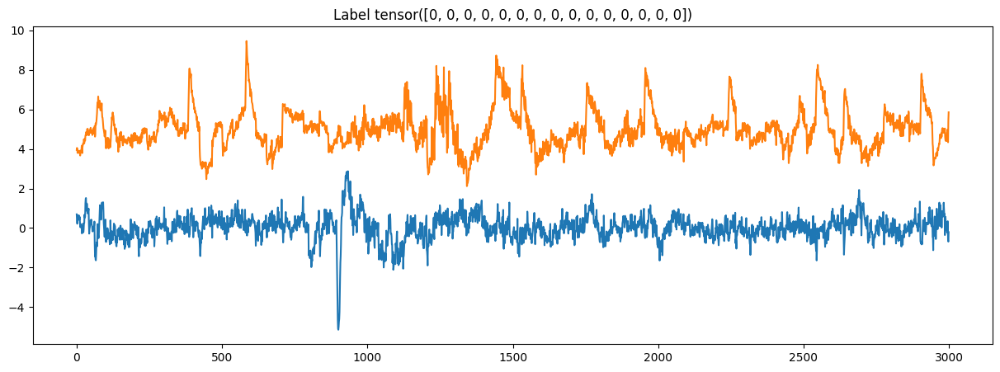

In [ ]:
eeg_data, eog_data, label = next(iter(infer_data_loader))
print(f"EEG batch shape: {eeg_data.size()}")
print(f"EOG batch shape: {eog_data.size()}")
# print(f"EMG batch shape: {eeg2_data.size()}")
print(f"Labels batch shape: {label.size()}")

eeg_data_temp = eeg_data[0].squeeze()#(0)
eog_data_temp = eog_data[0].squeeze()#(0)

print(eeg_data_temp.shape)

t = np.arange(0,30,1/100)
plt.figure(figsize = (15,5))
plt.plot(eeg_data_temp[0].squeeze())
plt.plot(eog_data_temp[0].squeeze()+5)
plt.title(f"Label {label[0].squeeze()}")
plt.show()




#Load Model

In [ ]:
from models.sequence_cmt import Seq_Cross_Transformer_Network #as Seq_Cross_Transformer_Network
from models.sequence_cmt import Epoch_Cross_Transformer
from models.model_blocks import PositionalEncoding, Window_Embedding, Intra_modal_atten, Cross_modal_atten, Feed_forward


In [ ]:
!gdown 1Y6yPH8XyVLTVY0Wbp8o6qcDWAv9n_NPG 

Downloading...
From: https://drive.google.com/uc?id=1Y6yPH8XyVLTVY0Wbp8o6qcDWAv9n_NPG
To: /content/Cross-Modal-Transformer/checkpoint_model_best_acc.pth.tar
100% 93.7M/93.7M [00:01<00:00, 81.9MB/s]


In [ ]:
test_model = torch.load('./checkpoint_model_best_acc.pth.tar', map_location=device)
test_model.eval()
print(sum(p.numel() for p in test_model.parameters() if p.requires_grad))

4049867


# Get Predictions

In [ ]:
import warnings
warnings.filterwarnings("ignore")

# feat_main = []
pred_val_main = torch.zeros((len(infer_data_loader)+num_seq,1,5))  #data, output,seq pred,
labels_val_main = torch.zeros((len(infer_data_loader)+num_seq,1))#data, output,seq pred,
first = 0 
m = torch.nn.Softmax()
with torch.no_grad():
    test_model.eval()
    for batch_val_idx, data_val in enumerate(infer_data_loader):
        val_eeg,val_eog, val_labels = data_val
        pred,_ = test_model(val_eeg.float().to(device), val_eog.float().to(device))
        
        labels_val_main[batch_val_idx:batch_val_idx+num_seq] += val_labels.squeeze().unsqueeze(dim=1)

        # feat_main.append(feat_list)
        for ep in range(num_seq):
            pred_val_main[batch_val_idx+ep] += m(pred[ep]).cpu() 
       

# pred_val_main = pred_val_main[num_seq-1:-num_seq]
pred_val_main = (pred_val_main/num_seq).squeeze()
# labels_val_main = labels_val_main[num_seq-1:-num_seq]
labels_val_main = labels_val_main//num_seq


print(pred_val_main.shape)
print(labels_val_main.shape)

torch.Size([1776, 5])
torch.Size([1776, 1])


In [ ]:
from utils.metrics import accuracy, kappa, g_mean, plot_confusion_matrix, confusion_matrix

sens_l,spec_l,f1_l,prec_l, sens,spec,f1,prec = confusion_matrix(pred_val_main, labels_val_main,
                                                5, labels_val_main.shape[0])


g = g_mean(sens, spec)

acc = accuracy(pred_val_main, labels_val_main)

kap = kappa(pred_val_main, labels_val_main)

print(f"Accuracy {acc}")
print(f"Kappa {kap}")
print(f"Macro F1 Score {f1}")
print(f"G Mean {g}")
print(f"Sensitivity {sens}")
print(f"Specificity {spec}")
print(f"Class wise F1 Score {f1_l}")

Accuracy 0.9161036036036037
Kappa 0.8663184323393163
Macro F1 Score 0.7184584379196167
G Mean 0.8407198772165702
Sensitivity 0.721274220943451
Specificity 0.9799461722373962
Class wise F1 Score [0.9812606573104858, 0.5714285969734192, 0.9217830300331116, 0.31578946113586426, 0.8020304441452026]


## Interpret Results

In [ ]:
infer_data_loader = data.DataLoader(infer_dataset, batch_size = 1, shuffle = False)#16
batch_size = len(infer_data_loader)
infer_data_loader = data.DataLoader(infer_dataset, batch_size = batch_size, shuffle = False)#16

In [ ]:
from einops import rearrange
import torch.nn.functional as F
import torch.nn as nn
import math


def atten_interpret(q, k):
 
  atten_weights = torch.softmax((q @ k.transpose(-2, -1) / math.sqrt(q.size(-1))), dim=-1)
  return atten_weights

In [ ]:
start_time_point = 38820 ### Set the time point in the signal to visualize.  ( For figure 6 in the paper Subject 38 Day 1 Start time point 38820)
t = start_time_point//30
print(t)
eeg_data, eog_data, label = next(iter(infer_data_loader))
print(f"EEG batch shape: {eeg_data.size()}")
print(f"EOG batch shape: {eog_data.size()}")
# print(f"EMG batch shape: {eeg2_data.size()}")
print(f"Labels batch shape: {label.size()}")


# print(t)
pred,feat_list = test_model(eeg_data[t].unsqueeze(0).float().to(device), eog_data[t].unsqueeze(0).float().to(device))
pred = np.array([i.argmax(-1).item() for i in pred])
print(label[t],pred)
# print((label[t]-pred).sum())

"""
Structure of feat_list:
15 lists: each for 30s PSG epoch in a sequence
          each contains 3 representations:
            1)Intra modal features of EEG
            2)Intra modal features of EOG
            3) Cross-modal features
Final element in the list contains inter epoch features.
"""


for i in feat_list[:-1]:
  print(i[0].shape,i[1].shape,i[2].shape)

print(feat_list[-1].shape)

  

1294
EEG batch shape: torch.Size([1761, 1, 15, 3000])
EOG batch shape: torch.Size([1761, 1, 15, 3000])
Labels batch shape: torch.Size([1761, 15])
tensor([4, 4, 4, 4, 0, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2]) [4 4 4 4 0 1 1 1 1 1 1 1 1 2 2]
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) torch.Size([1, 61, 128]) torch.Size([1, 3, 128])
torch.Size([1, 61, 128]) tor

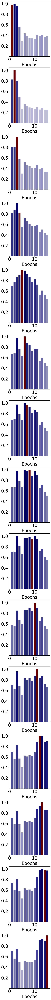

In [ ]:
###### Interpreting inter-epoch relationships  ##########
plt.rcParams['axes.linewidth'] = 2
seq_features = feat_list[-1]  ##extracting learned inter-epoch features
# seq_atten = atten_interpret(seq_features.squeeze(),seq_features.squeeze()).squeeze().detach().cpu().numpy()
# print(seq_atten.shape)

# plt.figure()
# plt.imshow(seq_atten)

fig, axs = plt.subplots(15, 1, figsize = (1*5,15*8))
for i in range(num_seq):
  seq_atten = atten_interpret(seq_features.squeeze()[i].unsqueeze(0),seq_features.squeeze()).squeeze().detach().cpu().numpy()


  rgba_colors = np.zeros((15,4))
  rgba_colors[:,0]=0#value of red intensity divided by 256 
  rgba_colors[i,0]=0.4#value of red intensity divided by 256 
  rgba_colors[:,1]=0  #value of green intensity divided by 256
  rgba_colors[:,2]=0.4  #value of blue intensity divided by 256
  rgba_colors[i,2]=0
  seq_atten = seq_atten/seq_atten.max()

  rgba_colors[:,-1]=seq_atten
  axs[i].bar(np.arange(1,16), seq_atten/seq_atten.max(),# color ='blue',
         color =rgba_colors,align='center', width = 0.8)
  # axs[i//5][i%5].set_title('')
  axs[i].tick_params(axis='x', labelsize=30)#,which = 'both')
  axs[i].tick_params(axis='y', labelsize=30)
  axs[i].set_xlabel('Epochs',fontsize = 30)
  yticks = axs[i].yaxis.get_major_ticks()
  yticks[0].label1.set_visible(False)

# plt.savefig(f'/content/inter_epoch_sub_{subject_no}_day_{days}_t_{t}.pdf',dpi = 300)





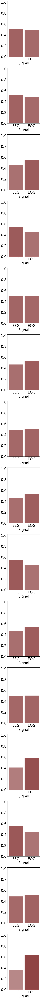

In [ ]:
###### Interpreting cross-modal relationships  ##########
fig, axs = plt.subplots(15, 1, figsize = (1*5,15*10))

for i in range(num_seq):
  cross_features = feat_list[i][-1]  ##extracting learned cross-modal features
  cross_atten = atten_interpret(cross_features.squeeze()[0].unsqueeze(0),cross_features.squeeze()[1:]).squeeze().detach().cpu().numpy()
  
  rgba_colors = np.zeros((2,4))
  rgba_colors[:,0]=0.4 #value of red intensity divided by 256 
  rgba_colors[:,1]=0  #value of green intensity divided by 256
  rgba_colors[:,2]=0 #value of blue intensity divided by 256
  rgba_colors[:,-1]= cross_atten+0.1
  axs[i].bar(['EEG','EOG'], cross_atten,# color ='red',
          color =rgba_colors,align='center', width = 0.9)
  axs[i].tick_params(axis='x', labelsize=30)#,which = 'both')
  axs[i].tick_params(axis='y', labelsize=30)
  axs[i].set_ylim(0,1.02)
  axs[i].set_xlabel('Signal',fontsize = 30)

# plt.savefig(f'/content/cross_modal_sub_{subject_no}_day_{days}_t_{t}_part_1.pdf',dpi = 300)



In [ ]:
def plot_interpret(x,y,dydx,fig,axs_no,signal_type = "EEG"):


    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    # plt.figure(figsize = (30,5))
    # plt.figure(figsize=(25,5))
    # plt.plot(x,dydx)
    # plt.title(f"Attention Map for Class {label}  {signal_type} ")
    # plt.xlim(x.min(),x.max())
    # plt.colorbar()

    # fig, axs = plt.subplots(2, 1, sharex=True, sharey=True,figsize = (30,10))

    # Create a continuous norm to map from data points to colors
    norm = plt.Normalize(dydx.min(), dydx.max())
    lc = LineCollection(segments, cmap='Reds', norm=norm)
    # Set the values used for colormapping
    lc.set_array(dydx)
    lc.set_linewidth(15)
    line = axs[axs_no[0]][axs_no[1]].add_collection(lc)
    # fig.colorbar(line, ax=axs[axs_no[0]][axs_no[1]])
    # fig.colorbar(line, ax=axs[1])
    # axs[axs_no[0]][axs_no[1]].set_xlabel(f"{signal_type}",fontsize = 100,labelpad = 20)
    axs[axs_no[0]][axs_no[1]].set_title(f'Epoch {i+1} {signal_type}',fontsize = 100)
    # axs[i].set_xlabel('Signal',fontsize = 100)
    # axs[axs_no[0]][axs_no[1]].axis('off')
    # Hide X and Y axes label marks
    axs[axs_no[0]][axs_no[1]].xaxis.set_tick_params(labelbottom=False)
    axs[axs_no[0]][axs_no[1]].yaxis.set_tick_params(labelleft=False)

    # Hide X and Y axes tick marks
    axs[axs_no[0]][axs_no[1]].set_xticks([])
    axs[axs_no[0]][axs_no[1]].set_yticks([])
    axs[axs_no[0]][axs_no[1]].set_xlim(x.min(), x.max())
    axs[axs_no[0]][axs_no[1]].set_ylim(y.min()-0.2,y.max()+0.2)
    # plt.show()
    # if save_path:
    #     fig.savefig(os.path.join(save_path,f"{signal_type}_{label}"))

In [ ]:
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm
###### Interpreting intra-modal relationships  ##########
plt.rcParams['axes.linewidth'] = 20
fig, axs = plt.subplots(15, 2, figsize = (2*50,15*20))
# seq_features = feat_list[-1]
for i in range(num_seq):
  eeg_features = feat_list[i][0]     ##extracting learned intra-modal EEG features 
  eog_features = feat_list[i][1]    ##extracting learned intra-modal EOG features 
  cross_features = feat_list[i][-1]  ##extracting learned cross-modal features

  eeg_atten = atten_interpret(cross_features.squeeze()[0].unsqueeze(0),eeg_features.squeeze()[1:])#.squeeze().detach().cpu().numpy()
  eog_atten = atten_interpret(cross_features.squeeze()[0].unsqueeze(0),eog_features.squeeze()[1:])#.squeeze().detach().cpu().numpy()
  
  eeg_atten = F.upsample(eeg_atten.unsqueeze(0),scale_factor=3000//60, mode='nearest').squeeze().detach().cpu().numpy()
  eog_atten = F.upsample(eog_atten.unsqueeze(0),scale_factor=3000//60, mode='nearest').squeeze().detach().cpu().numpy()
  
  t1 = np.arange(0,30,1/100)
  plot_interpret(t1,eeg_data[t,0,i,:].squeeze().cpu().numpy(),eeg_atten,fig,[i,0],signal_type = "EEG")
  plot_interpret(t1,eog_data[t,0,i,:].squeeze().cpu().numpy(),eog_atten,fig,[i,1],signal_type = "EOG")
  